<a href="https://colab.research.google.com/github/ManciniGa/1-Projeto-ps5js/blob/main/YOLOv8_Detectando_Objetos_YOLO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# YOLOv8

## Instalação e Configuração

In [ ]:
!pip install ultralytics

In [ ]:
import ultralytics

In [ ]:
ultralytics.checks()

Ultralytics YOLOv8.2.91 🚀 Python-3.10.12 torch-2.4.0+cu121 CPU (Intel Xeon 2.20GHz)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 32.8/107.7 GB disk)


In [ ]:
import torch
torch.cuda.is_available()

False

In [ ]:
# conda install pytorch torchvision torchaudio pytorch-cuda=11.7 -c pytorch -c nvidia

In [ ]:
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


### Clonar repositório (alternativa)

In [ ]:
#!git clone https://github.com/ultralytics/ultralytics
#!pip install -r /content/ultralytics/requirements.txt
#!pip install -qe ultralytics

### Importação das demais bibliotecas

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os
from PIL import Image
from google.colab.patches import cv2_imshow

## Download do modelo

- Os modelos do YOLOv8 podem ser baixados aqui:
https://github.com/ultralytics/assets/releases

In [ ]:
#!wget https://github.com/ultralytics/assets/releases/download/v0.0.0/yolov8n.pt

## Realizando a detecção

A forma mais rápida de executar a deteçcão é através da CLI, conforme pode ver abaixo a sintaxe.

Os parâmetros:
* **task** - tarefa, podendo ser detecção, segmentação ou classificação
* **model** - o modelo que queremos usar. São disponibilizados 5 modelos: YOLOv8n (nano), YOLOv8s (small), YOLOv8m (medium), YOLOv8l (large), YOLOv8x (extra large). Nano é o mais rápido e o menor (menos pesado para rodar), enquanto que o Extra Large (YOLOv8x) é o mais preciso porém mais pesado para rodar, portanto será mais lento.
  Para o valor desse parâmetro, basta informar o nome e ao lado .pt pois é a extensão do modelo treinado em pytorch.

* **mode** - basicamente é o que queremos com o comando. queremos fazer a detecção/inferência/predição, portanto deixe =predict. Valores aceitos: [train, val, predict, export]

* **conf** - o limiar (threshold) que usaremos para filtrar detecções "fracas". Se a confiança estiver abaixo desse valor, não será considerada. Por padrão podemos configurar com um limiar bem baixo (ex: 0.25) e depois aumentar, caso verifique que detectou incorretamente algum objeto.  
* **source** - a imagem ou vídeo que queremos fazer a detecção.

In [ ]:
!yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source='/content/cachorros.jpg' save=True

Ultralytics YOLOv8.2.91 🚀 Python-3.10.12 torch-2.4.0+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv8n summary (fused): 168 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs

image 1/1 /content/cachorros.jpg: 448x640 3 dogs, 158.9ms
Speed: 4.2ms preprocess, 158.9ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict4
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [ ]:
def mostrar(img):
  fig = plt.gcf()
  fig.set_size_inches(16,10)
  plt.axis('off')
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.show()

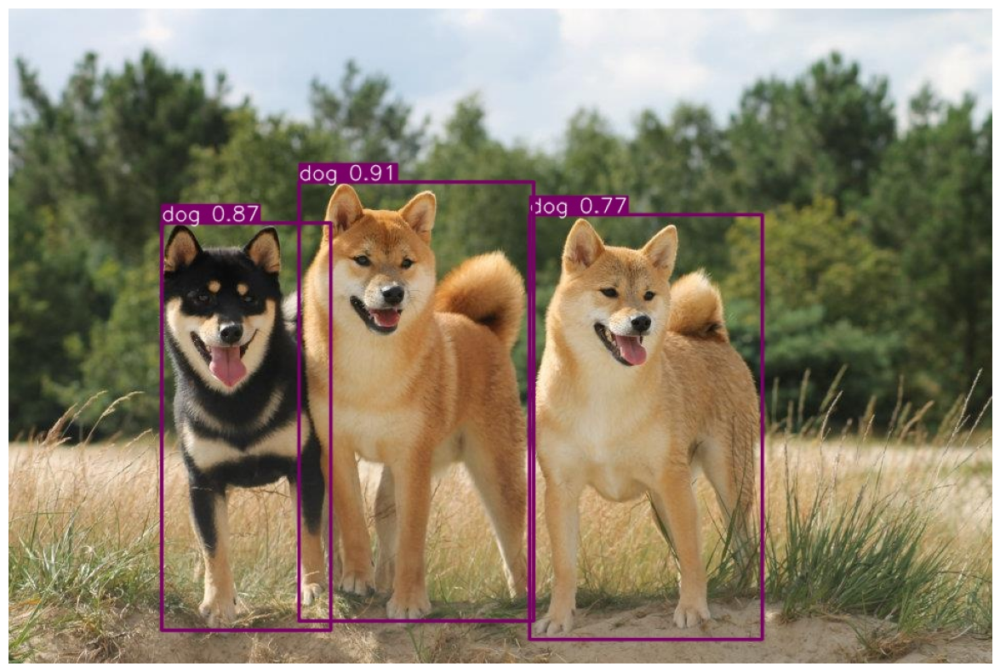

In [ ]:
resultado = cv2.imread('/content/runs/detect/predict/cachorros.jpg')
mostrar(resultado)

In [ ]:
!yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source='https://ultralytics.com/images/zidane.jpg' save=True

Ultralytics YOLOv8.2.91 🚀 Python-3.10.12 torch-2.4.0+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv8n summary (fused): 168 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs

Found https://ultralytics.com/images/zidane.jpg locally at zidane.jpg
image 1/1 /content/zidane.jpg: 384x640 2 persons, 1 tie, 144.3ms
Speed: 3.6ms preprocess, 144.3ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict5
💡 Learn more at https://docs.ultralytics.com/modes/predict


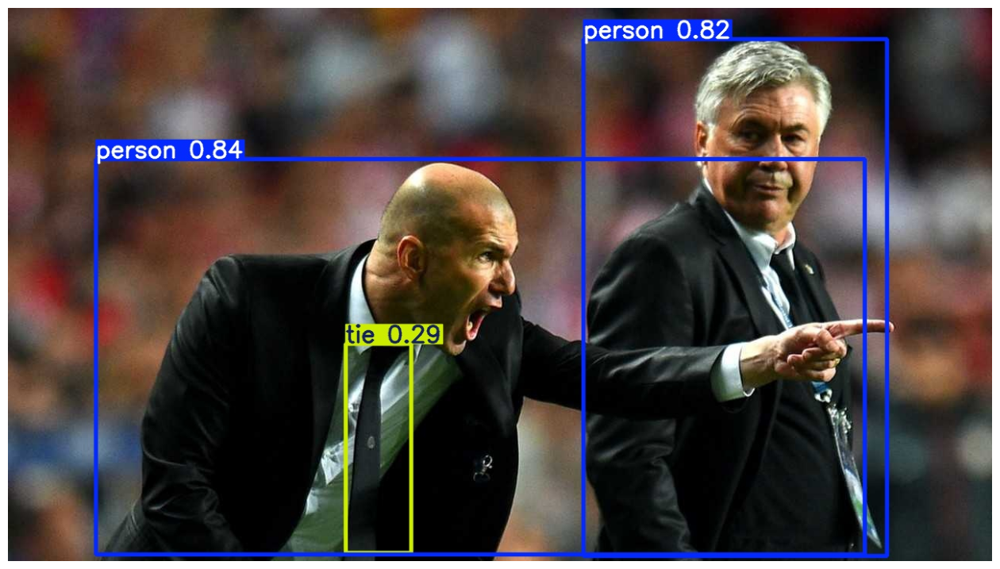

In [ ]:
resultado = cv2.imread('/content/runs/detect/predict2/zidane.jpg')
mostrar(resultado)

### Alterando o limiar (threshold)

In [ ]:
!yolo task=detect mode=predict model=yolov8n.pt conf=0.4 source='/content/cachorros02.jpg' save=true

Ultralytics YOLOv8.2.91 🚀 Python-3.10.12 torch-2.4.0+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv8n summary (fused): 168 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs

image 1/1 /content/cachorros02.jpg: 448x640 2 dogs, 263.0ms
Speed: 4.1ms preprocess, 263.0ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict6
💡 Learn more at https://docs.ultralytics.com/modes/predict


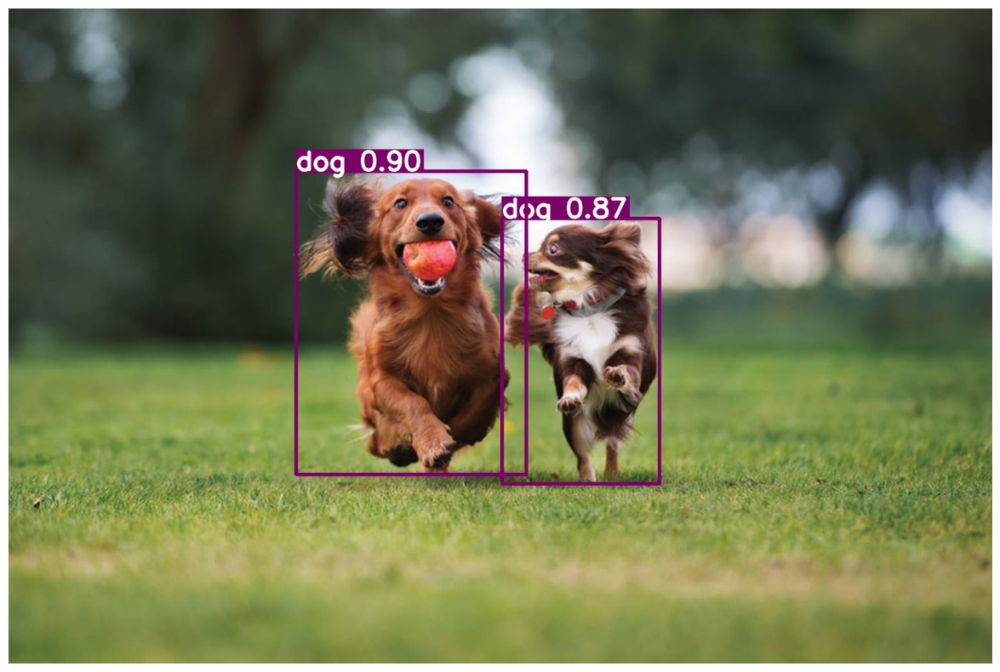

In [ ]:
resultado = cv2.imread('/content/runs/detect/predict3/cachorros02.jpg')
mostrar(resultado)

In [ ]:
!yolo task=detect mode=predict model=yolov8n.pt conf=0.6 source='/content/cachorros02.jpg' save=true

Ultralytics YOLOv8.2.91 🚀 Python-3.10.12 torch-2.4.0+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv8n summary (fused): 168 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs

image 1/1 /content/cachorros02.jpg: 448x640 2 dogs, 160.6ms
Speed: 4.6ms preprocess, 160.6ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict7
💡 Learn more at https://docs.ultralytics.com/modes/predict


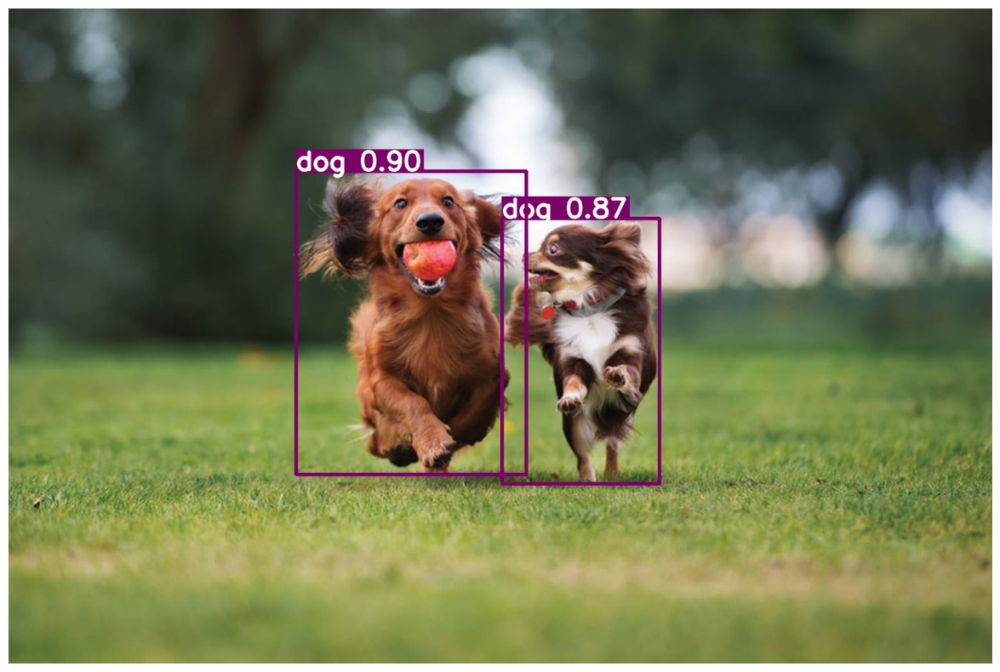

In [ ]:
resultado = cv2.imread('/content/runs/detect/predict7/cachorros02.jpg')
mostrar(resultado)

## Detecção em múltiplas imagens de uma vez

In [ ]:
!yolo task=detect mode=predict model=yolov8n.pt conf=0.5 source='/content/imagens' save=true

Ultralytics YOLOv8.2.91 🚀 Python-3.10.12 torch-2.4.0+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv8n summary (fused): 168 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs

image 1/5 /content/imagens/apple.jpg: 448x640 1 apple, 245.5ms
image 2/5 /content/imagens/cachorro_gato.jpg: 608x640 2 dogs, 323.5ms
image 3/5 /content/imagens/cachorros.jpg: 448x640 3 dogs, 208.0ms
image 4/5 /content/imagens/cachorros02.jpg: 448x640 2 dogs, 234.7ms
image 5/5 /content/imagens/zidane.jpg: 384x640 2 persons, 214.8ms
Speed: 4.5ms preprocess, 245.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict8
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [ ]:
dir_resultados = '/content/runs/detect/predict8/'

In [ ]:
caminhos = [os.path.join(dir_resultados, f) for f in os.listdir(dir_resultados)]
print(caminhos)

['/content/runs/detect/predict8/cachorro_gato.jpg', '/content/runs/detect/predict8/apple.jpg', '/content/runs/detect/predict8/zidane.jpg', '/content/runs/detect/predict8/cachorros02.jpg', '/content/runs/detect/predict8/cachorros.jpg']


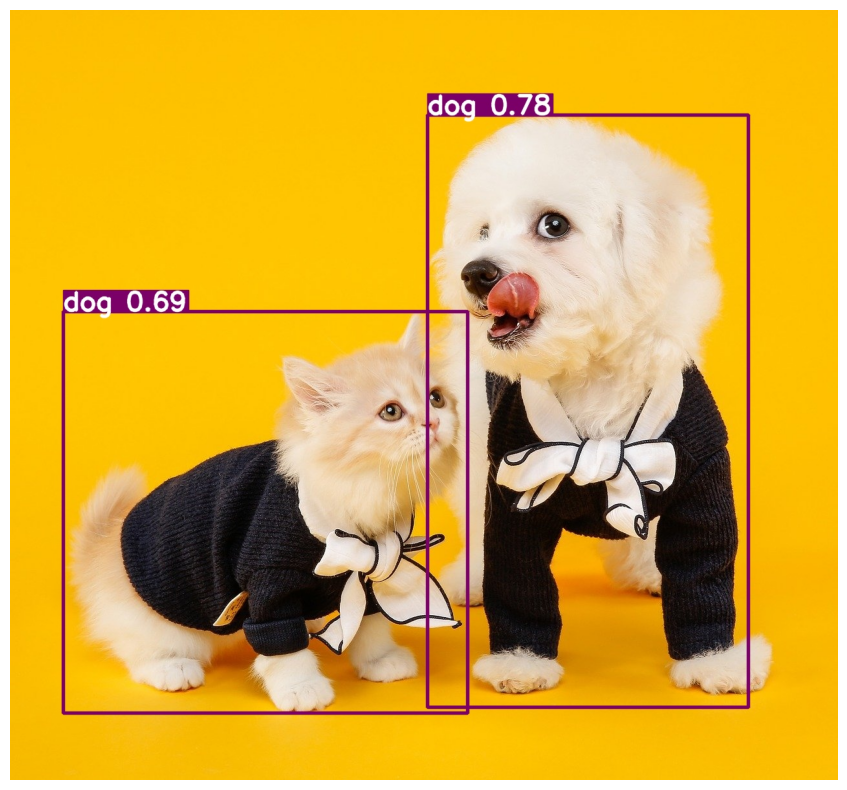

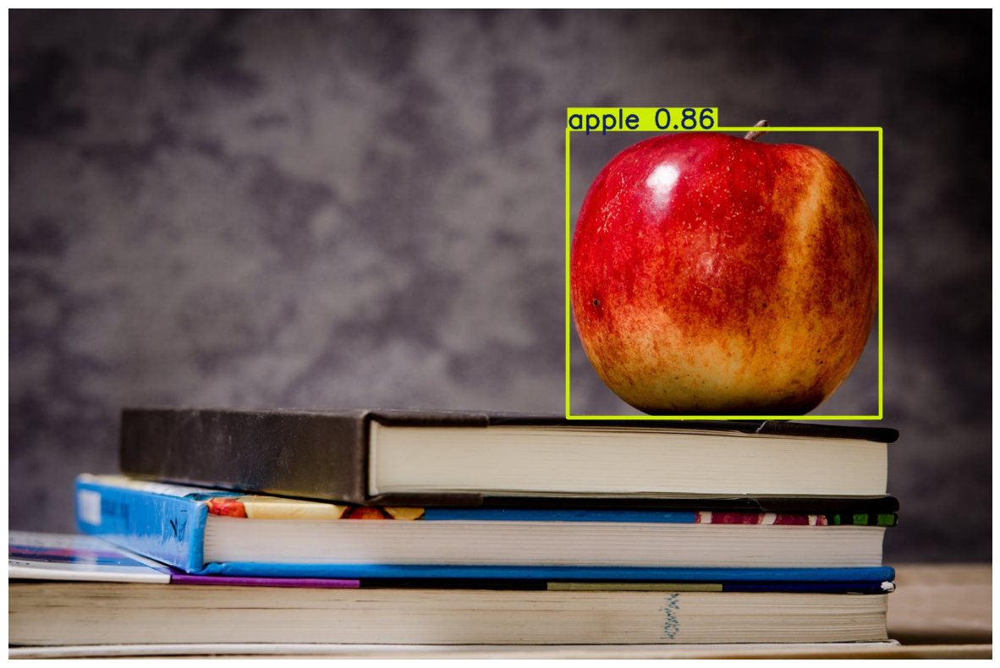

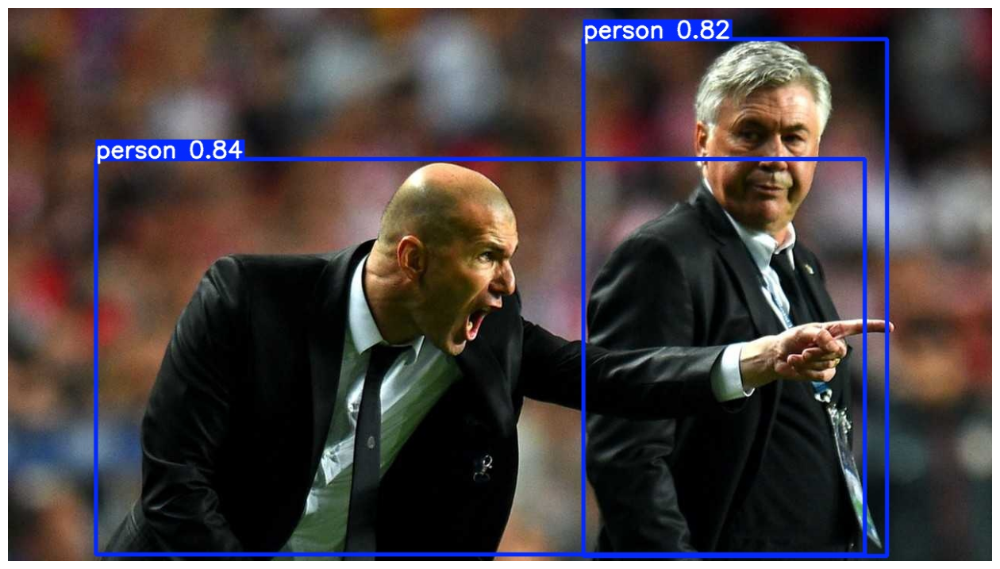

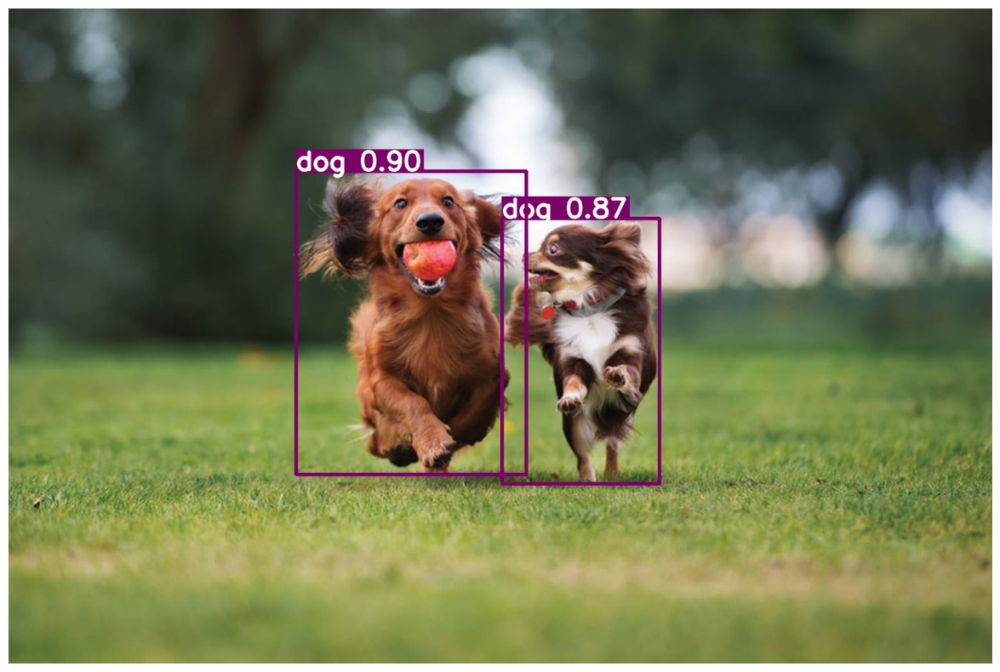

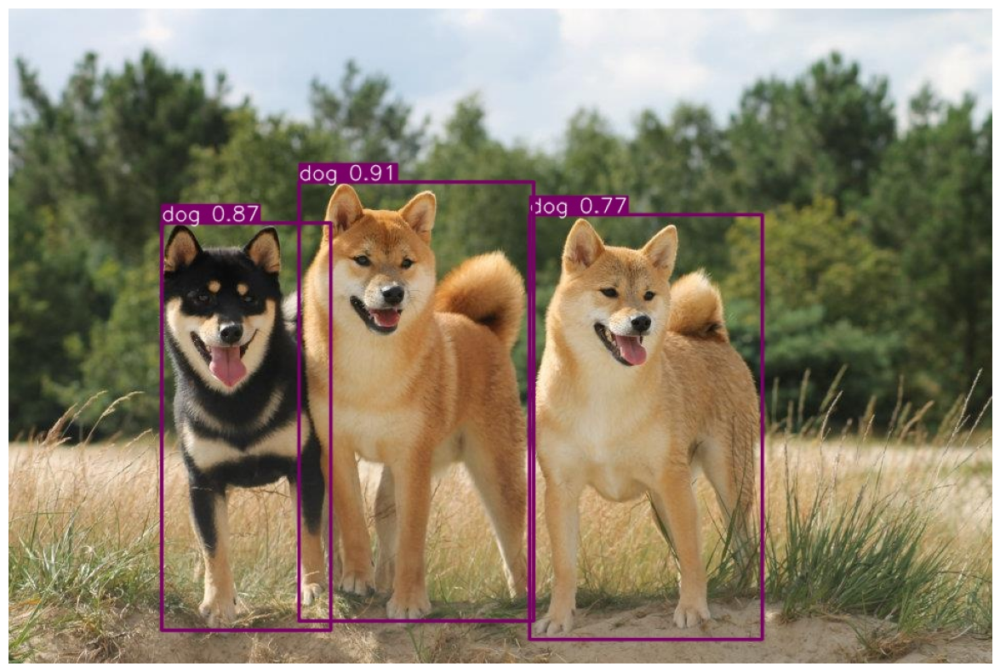

In [ ]:
for caminho_imagem in caminhos:
  #print(caminho_imagem)
  imagem = cv2.imread(caminho_imagem)
  mostrar(imagem)

## Realizando a detecção - método através do Python

In [ ]:
from ultralytics import YOLO

In [ ]:
model = YOLO('yolov8n.pt')

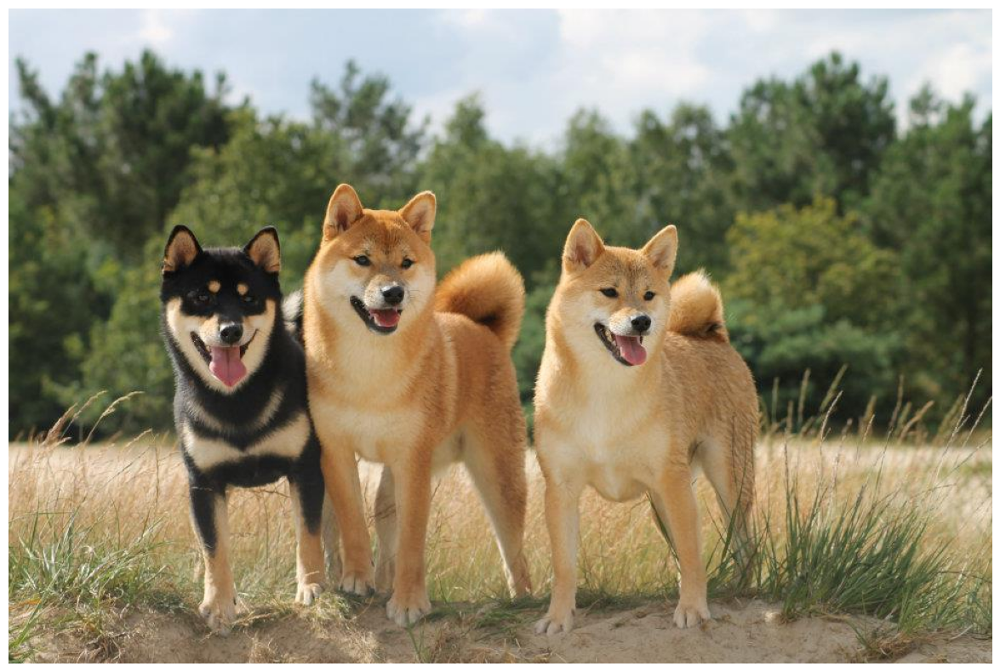

In [ ]:
caminho_img = '/content/imagens/cachorros.jpg'
img = cv2.imread(caminho_img)
mostrar(img)

Para a deteção usaremos o método model.predict().

Ele aceita basicamente os mesmos parâmetros do método via CLI, que vimos nos exemplos mais acima.

* source -- A função aceita a imagem nos seguintes formatos:
  * imagem em ndarray (usando o cv2.imread) ou PIL
  * diretório
  * caminho
  * URL
  * video
  * webcam (valor 0, que corresponde ao indice do dispositivo de câmera)

* save -- se desejar salvar a imagem no diretório predict deixei save=True. aqui nós vamos fazer de outra maneira, então não precisa setar esse parâmetro

* conf -- limiar de confiança

* show -- Informe o parâmetro show=True para mostrar os valores das predições

* save_txt -- se deseja salvar em um txt os resultados

mais parâmetros https://docs.ultralytics.com/cfg/

In [ ]:
resultados = model.predict(source=img)


0: 448x640 3 dogs, 153.6ms
Speed: 4.4ms preprocess, 153.6ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)


In [ ]:
resultados

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted p

In [ ]:
for r in resultados:
  print(r.boxes.data)

tensor([[283.1483, 169.5603, 512.2313, 598.1078,   0.9150,  16.0000],
        [149.1904, 209.6510, 314.2391, 607.8404,   0.8709,  16.0000],
        [508.2393, 201.4497, 735.6066, 616.0237,   0.7686,  16.0000]])


In [ ]:
for r in resultados:
  print(r.boxes.conf)

tensor([0.9150, 0.8709, 0.7686])


### Desenhando a caixa delimitadora sobre a imagem



In [ ]:
import funcoes_desenho

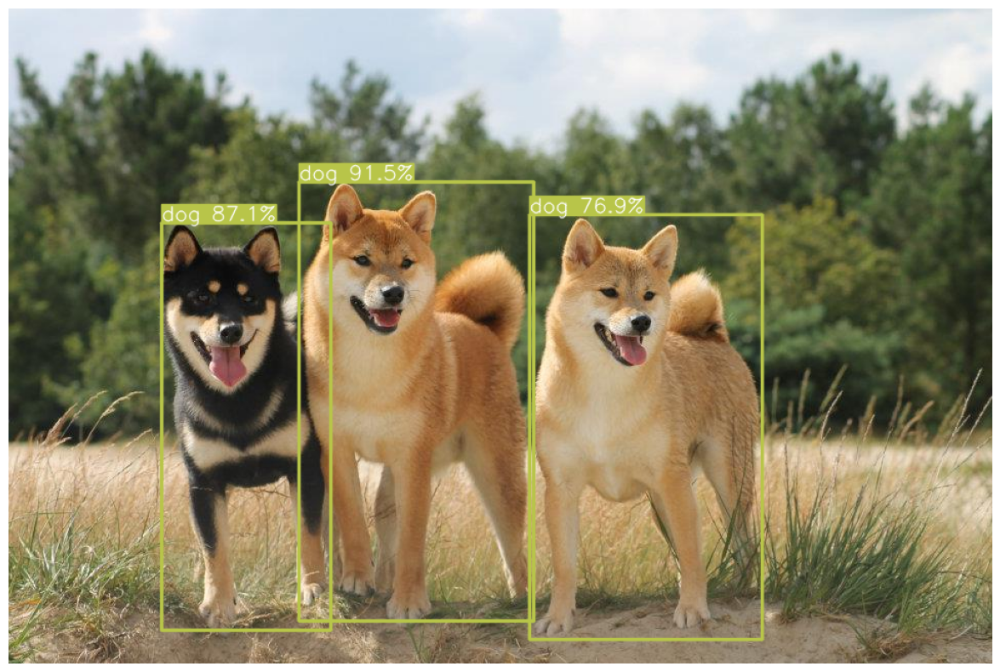

In [ ]:
resultado = funcoes_desenho.desenha_caixas(img, resultados[0].boxes.data)
mostrar(resultado)

## Teste com outros modelos


100%|██████████| 49.7M/49.7M [00:00<00:00, 159MB/s]



0: 448x640 2 dogs, 1170.8ms
Speed: 3.1ms preprocess, 1170.8ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)


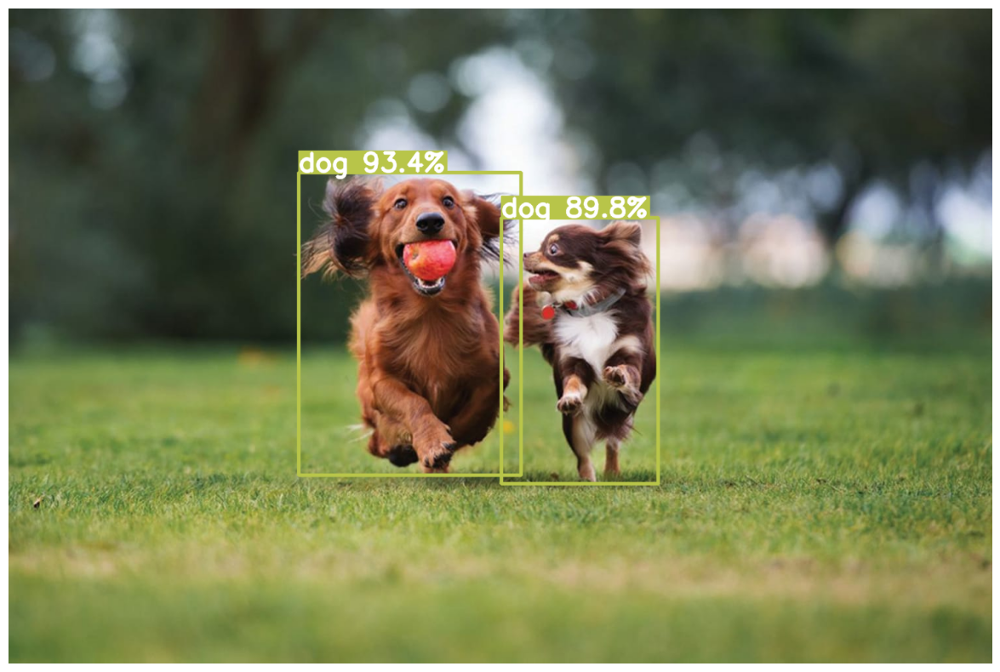

In [ ]:
model = YOLO('yolov8m.pt')
caminho_img = '/content/imagens/cachorros02.jpg'
img = cv2.imread(caminho_img)
resultados = model.predict(source = img, conf=0.6)
resultado_img = funcoes_desenho.desenha_caixas(img, resultados[0].boxes.data)
mostrar(resultado_img)

> Usando o YOLOv8x (extra large)


0: 448x640 2 dogs, 3390.4ms
Speed: 4.6ms preprocess, 3390.4ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


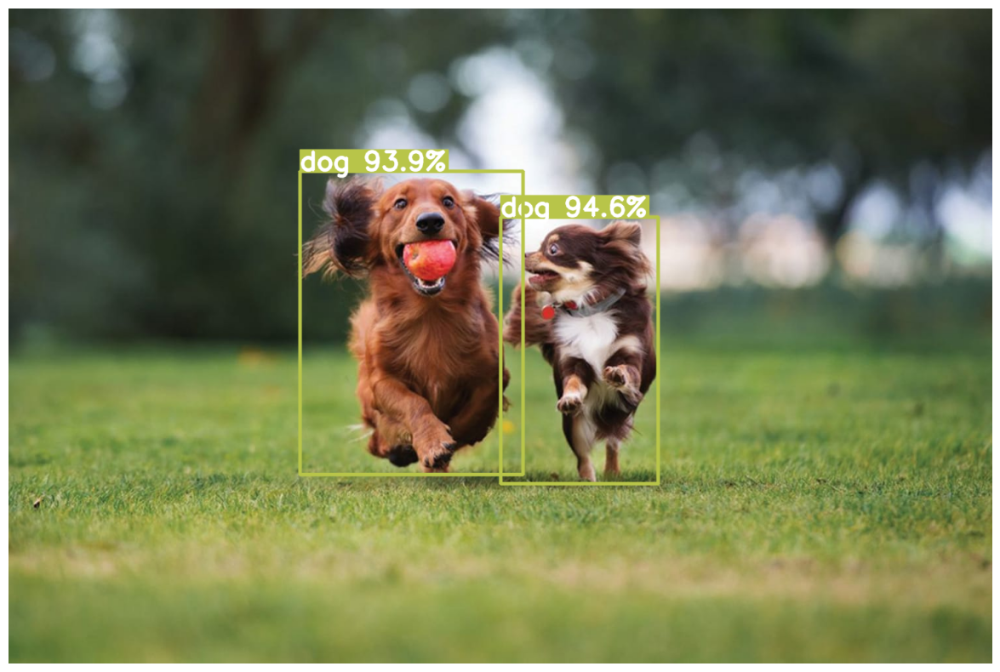

In [ ]:
model = YOLO('yolov8x.pt')
caminho_img = '/content/imagens/cachorros02.jpg'
img = cv2.imread(caminho_img)
resultados = model.predict(source = img, conf=0.6)
resultado_img = funcoes_desenho.desenha_caixas(img, resultados[0].boxes.data)
mostrar(resultado_img)

## Validação do modelo

In [ ]:
import torch
torch.hub.download_url_to_file('https://ultralytics.com/assets/coco2017val.zip', 'tmp.zip')

100%|██████████| 780M/780M [00:07<00:00, 104MB/s]


In [ ]:
!unzip -q tmp.zip -d ../datasets && rm tmp.zip

In [ ]:
!yolo task=detect mode=val model=yolov8x.pt data=coco128.yaml

Ultralytics YOLOv8.2.91 🚀 Python-3.10.12 torch-2.4.0+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv8x summary (fused): 268 layers, 68,200,608 parameters, 0 gradients, 257.8 GFLOPs

Dataset 'coco128.yaml' images not found ⚠️, missing path '/content/datasets/coco128/images/train2017'
100% 6.66M/6.66M [00:00<00:00, 52.4MB/s]
Unzipping /content/datasets/coco128.zip to /content/datasets/coco128...: 100% 263/263 [00:00<00:00, 3239.59file/s]
Dataset download success ✅ (1.0s), saved to /content/datasets

100% 755k/755k [00:00<00:00, 10.8MB/s]
val: Scanning /content/datasets/coco128/labels/train2017... 126 images, 2 backgrounds, 0 corrupt: 100% 128/128 [00:00<00:00, 1915.05it/s]
val: New cache created: /content/datasets/coco128/labels/train2017.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  88% 7/8 [08:56<01:16, 76.68s/it]
Traceback (most recent call last):
  File "/usr/local/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
  File "/usr/local/lib

## Detecção em vídeos

In [ ]:
!yolo task=detect mode=predict model=yolov8m.pt conf=0.5 source='/content/video_pessoas01.mp4' save=true

Ultralytics YOLOv8.2.91 🚀 Python-3.10.12 torch-2.4.0+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv8m summary (fused): 218 layers, 25,886,080 parameters, 0 gradients, 78.9 GFLOPs

Traceback (most recent call last):
  File "/usr/local/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/__init__.py", line 830, in entrypoint
    getattr(model, mode)(**overrides)  # default args from model
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/engine/model.py", line 567, in predict
    return self.predictor.predict_cli(source=source) if is_cli else self.predictor(source=source, stream=stream)
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/engine/predictor.py", line 183, in predict_cli
    for _ in gen:  # sourcery skip: remove-empty-nested-block, noqa
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/_contextlib.py", line 36, in generator_context
    response = gen.send(None)
  File "/usr/local/lib/pyth

In [ ]:
import os
video_salvo = '/content/runs/detect/predict6/video_pessoas01.mp4'
video_final = '/content/video_pessoas01_resultado.mp4'
os.system(f"ffmpeg -i {video_salvo} -vcodec libx264 {video_final}")

256

In [ ]:
def exibir_video(video_caminho):
  from IPython.display import HTML
  from base64 import b64encode
  mp4 = open(video_caminho, 'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
  return HTML("""
  <video width=500 controls>
    <source src="%s" type="video/mp4"
  </video>
  """ % data_url)

In [ ]:
exibir_video(video_final)

FileNotFoundError: [Errno 2] No such file or directory: '/content/video_pessoas01_resultado.mp4'

## Segmentação de imagens

### Via CLI

In [ ]:
!yolo task=segment mode=predict model=yolov8m-seg.pt conf=0.5 source='/content/imagens/cachorros.jpg' save=true

100% 52.4M/52.4M [00:00<00:00, 168MB/s]
Ultralytics YOLOv8.2.91 🚀 Python-3.10.12 torch-2.4.0+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv8m-seg summary (fused): 245 layers, 27,268,704 parameters, 0 gradients, 110.2 GFLOPs

image 1/1 /content/imagens/cachorros.jpg: 448x640 3 dogs, 1321.2ms
Speed: 2.8ms preprocess, 1321.2ms inference, 25.3ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/segment/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


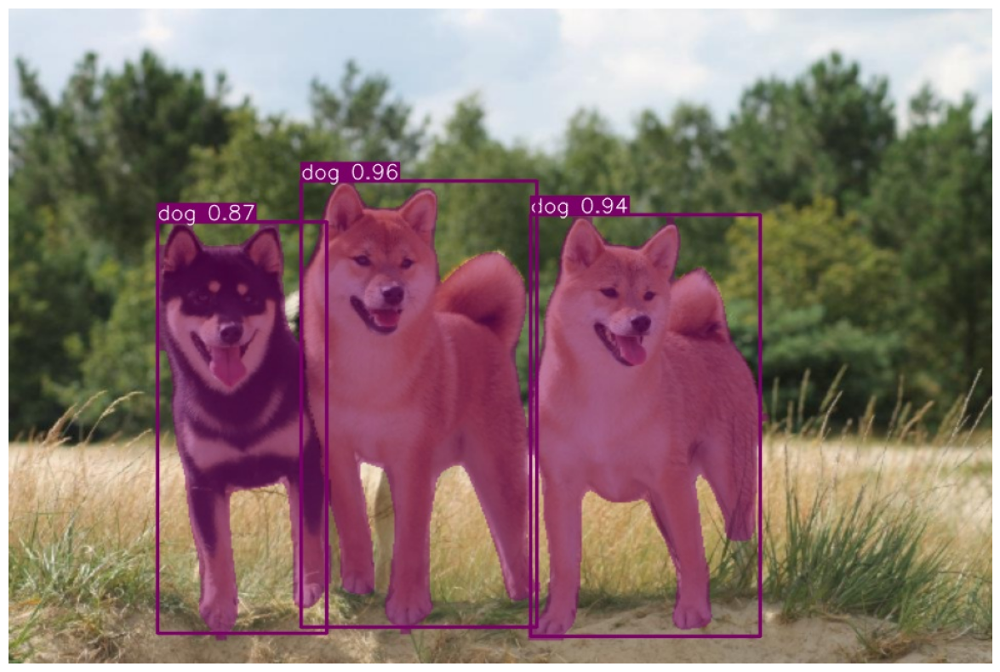

In [ ]:
resultado = cv2.imread('/content/runs/segment/predict/cachorros.jpg')
mostrar(resultado)

### Via Python


0: 448x640 2 dogs, 1204.4ms
Speed: 5.0ms preprocess, 1204.4ms inference, 9.6ms postprocess per image at shape (1, 3, 448, 640)


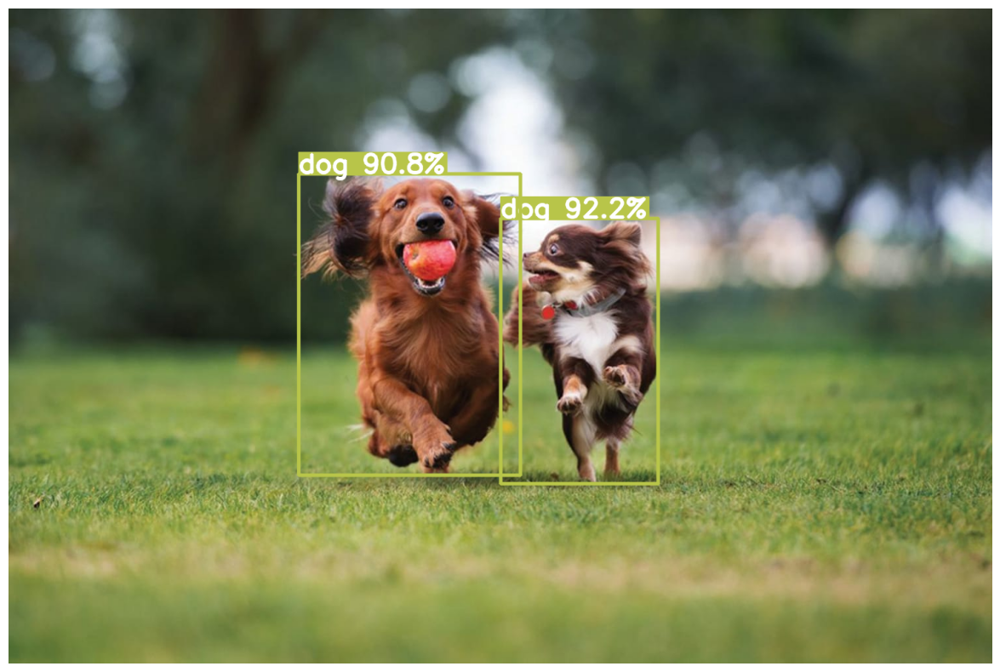

In [ ]:
model_seg = YOLO('yolov8m-seg.pt')
caminho_img = '/content/imagens/cachorros02.jpg'
img = cv2.imread(caminho_img)
resultados = model_seg.predict(source=img, conf=0.6)
resultado_img = funcoes_desenho.desenha_caixas(img, resultados[0].boxes.data)
mostrar(resultado_img)


0: 448x640 2 dogs, 3848.7ms
Speed: 4.7ms preprocess, 3848.7ms inference, 6.3ms postprocess per image at shape (1, 3, 448, 640)


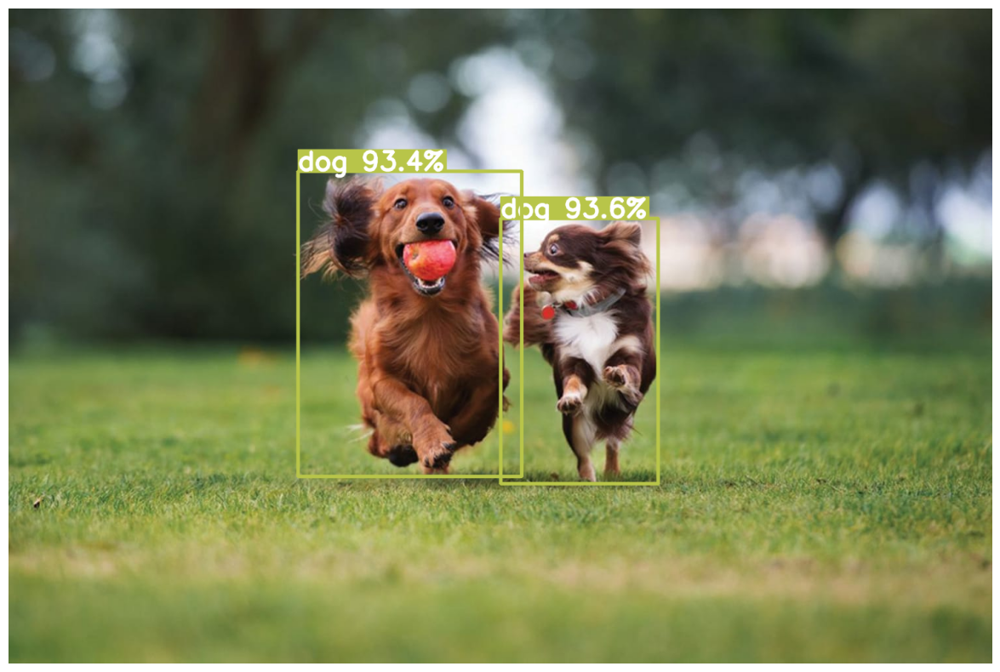

In [ ]:
model_seg = YOLO('yolov8x-seg.pt')
caminho_img = '/content/imagens/cachorros02.jpg'
img = cv2.imread(caminho_img)
resultados = model_seg.predict(source=img, conf=0.6)
resultado_img = funcoes_desenho.desenha_caixas(img, resultados[0].boxes.data)
mostrar(resultado_img)

### Segmentação em vídeos

In [ ]:
!wget https://github.com/gabevr/yolo/raw/master/videos/video_rua01.mp4

--2024-09-11 18:50:42--  https://github.com/gabevr/yolo/raw/master/videos/video_rua01.mp4
Resolving github.com (github.com)... 140.82.112.3
Connecting to github.com (github.com)|140.82.112.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/gabevr/yolo/master/videos/video_rua01.mp4 [following]
--2024-09-11 18:50:42--  https://raw.githubusercontent.com/gabevr/yolo/master/videos/video_rua01.mp4
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5645465 (5.4M) [application/octet-stream]
Saving to: ‘video_rua01.mp4’

video_rua01.mp4     100%[===================>]   5.38M  --.-KB/s    in 0.1s    

2024-09-11 18:50:43 (43.4 MB/s) - ‘video_rua01.mp4’ saved [5645465/5645465]



In [ ]:
!yolo task=segment mode=predict model=yolov8m-seg.pt conf=0.5 source='/content/video_rua01.mp4' save=true

Ultralytics YOLOv8.2.91 🚀 Python-3.10.12 torch-2.4.0+cu121 CPU (Intel Xeon 2.20GHz)
YOLOv8m-seg summary (fused): 245 layers, 27,268,704 parameters, 0 gradients, 110.2 GFLOPs

video 1/1 (frame 1/349) /content/video_rua01.mp4: 384x640 2 persons, 1 car, 1087.7ms
video 1/1 (frame 2/349) /content/video_rua01.mp4: 384x640 2 persons, 2 cars, 1054.8ms
video 1/1 (frame 3/349) /content/video_rua01.mp4: 384x640 3 persons, 1 car, 1092.0ms
video 1/1 (frame 4/349) /content/video_rua01.mp4: 384x640 4 persons, 1 car, 1061.5ms
video 1/1 (frame 5/349) /content/video_rua01.mp4: 384x640 5 persons, 1 car, 1041.8ms
video 1/1 (frame 6/349) /content/video_rua01.mp4: 384x640 5 persons, 1 car, 1353.2ms
video 1/1 (frame 7/349) /content/video_rua01.mp4: 384x640 6 persons, 1 car, 1783.5ms
video 1/1 (frame 8/349) /content/video_rua01.mp4: 384x640 7 persons, 1 car, 1112.2ms
video 1/1 (frame 9/349) /content/video_rua01.mp4: 384x640 8 persons, 1 car, 1009.5ms
video 1/1 (frame 10/349) /content/video_rua01.mp4: 384x640 

In [ ]:
video_salvo = "/content/runs/segment/predict2/video_rua01.mp4"
video_final = "/content/segmentacao_rua01.mp4"

os.system(f"ffmpeg -i {video_salvo} -vcodec libx264 {video_final}")

256

In [ ]:
exibir_video(video_final)

FileNotFoundError: [Errno 2] No such file or directory: '/content/segmentacao_rua01.mp4'